<a href="https://colab.research.google.com/github/21bq1a4232/Machine-Learning/blob/main/Paragraph_detection_using_YoloV5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Model Build and Traning

In [1]:
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
%pip install -qr requirements.txt  # install dependencies

%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 16680, done.
remote: Counting objects: 100% (221/221), done.
remote: Compressing objects: 100% (160/160), done.
remote: Total 16680 (delta 102), reused 131 (delta 61), pack-reused 16459
Receiving objects: 100% (16680/16680), 15.32 MiB | 7.58 MiB/s, done.
Resolving deltas: 100% (11408/11408), done.
/content/yolov5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 2.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 12.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.9/64.9 kB 5.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 793.0/793.0 kB 21.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 5.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 47.2 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the fol

In [2]:
# set up environment
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

In [3]:
from roboflow import Roboflow
rf = Roboflow(api_key="Tvj7VNd7sm8WSuua5NNW")
project = rf.workspace("imageclassification-0i5mp").project("hello-x1hkz")
version = project.version(2)
dataset = version.download("yolov5")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to /content/datasets/Hello-2 in yolov5pytorch:: 100%|██████████| 300/300 [00:00<00:00, 3340.61it/s]


In [ ]:
!python train.py --img 416 --batch 140 --epochs 600 --data "/content/datasets/Hello-2/data.yaml"

In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [45]:
!python detect.py --weights /content/best.pt --img 416 --conf 0.70 --source "/content/doc.jpg" --save-crop --save-txt

detect: weights=['/content/best.pt'], source=/content/doc.jpg, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.7, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_csv=False, save_conf=False, save_crop=True, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-331-gab364c98 Python-3.10.12 torch-2.3.0+cu121 CPU

Fusing layers... 
Model summary: 157 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
image 1/1 /content/doc.jpg: 416x352 4 sections, 165.0ms
Speed: 1.2ms pre-process, 165.0ms inference, 1.1ms NMS per image at shape (1, 3, 416, 416)
Results saved to runs/detect/exp12
1 labels saved to runs/detect/exp12/labels


In [ ]:
!sudo apt update
!sudo apt install tesseract-ocr
!sudo apt-get install poppler-utils

In [72]:
import os
import subprocess
import shutil
import cv2
import pytesseract
import os
pytesseract.pytesseract.tesseract_cmd = r'/usr/bin/tesseract'

def perform_ocr_on_folder(folder_path):
    p=1
    for filename in os.listdir(folder_path):
        if filename.endswith(('.jpg', '.png', '.jpeg')):  # Add more extensions if needed
            image_path = os.path.join(folder_path, filename)
            img = cv2.imread(image_path)

            try:

                text = pytesseract.image_to_string(img)
                print(f"paragraph {p}:\n")
                p+=1

            except Exception as e:
                print(f"Error processing {filename}: {e}")


def run_detection(image_path, weights_path, img_size, conf_threshold):
    command = [
        'python', 'detect.py',
        '--weights', weights_path,
        '--img', str(img_size),
        '--conf', str(conf_threshold),
        '--source', image_path,
        '--save-crop'
    ]
    subprocess.run(command)

def rename_and_move_crops(output_folder, crop_count):
    exp_folders = [f.path for f in os.scandir('runs/detect') if f.is_dir() and f.name.startswith('exp')]
    latest_exp_folder = max(exp_folders, key=os.path.getctime)

    crop_source_folder = os.path.join(latest_exp_folder, 'crops')
    for root, _, files in os.walk(crop_source_folder):
        for file in files:
            if file.endswith(('.jpg', '.png')):
                crop_count += 1
                new_filename = f"crop{crop_count}.jpg"
                new_filepath = os.path.join(output_folder, new_filename)
                shutil.move(os.path.join(root, file), new_filepath)
    return crop_count

def main():
    image_folder = "/content/pdf_images"  # Input images folder
    weights_path = "/content/best.pt"       # Path to the YOLOv5 weights file
    img_size = 416                          # Image size for YOLOv5 model
    conf_threshold = 0.70                   # Confidence threshold for detections
    output_folder = "/content/cropped_images"  # Folder to save cropped images

    # Create output folder if it doesn't exist
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    # Get list of image files in the input folder
    image_files = [f for f in os.listdir(image_folder) if f.endswith(('.jpg', '.png', '.jpeg'))]

    crop_count = 0  # Initialize crop count

    # Iterate over each image file and run YOLOv5 detection
    for image_file in image_files:
        image_path = os.path.join(image_folder, image_file)
        run_detection(image_path, weights_path, img_size, conf_threshold)
        crop_count = rename_and_move_crops(output_folder, crop_count)

    print(f"Detection and cropping completed. Cropped images saved in {output_folder}")
    # Example usage:
    image_folder = '/content/cropped_images'  # Replace with the actual folder path
    perform_ocr_on_folder(image_folder)

if __name__ == "__main__":
    main()


Detection and cropping completed. Cropped images saved in /content/cropped_images
paragraph 1:

Text extracted from crop34.jpg:
29, Please provide summary statistics to describe the intra-donor average, standard
deviation, and %CV among replicates as well as the inter-donor average. standard
error, and 9%CV, as applicable. The number of donors and number of replicates for
‘each donor used in the studies should be reported.

---
paragraph 2:

Text extracted from crop38.jpg:
'34.As recommended in the FDA Bioanalytical Method Validation Guidance, all study
‘samples from a subject (donor) should be analyzed in a single run. Additionally, we
recommend all sample analysis should begin after completing dosing of all donors,
Please note the calibration standards and QC samples should be prepared in a
similar way as the IVPT study samples.

---
paragraph 3:

Text extracted from crop6.jpg:
23. You mentioned the skin surface temperature of control cells was measured at each
time point. Please p

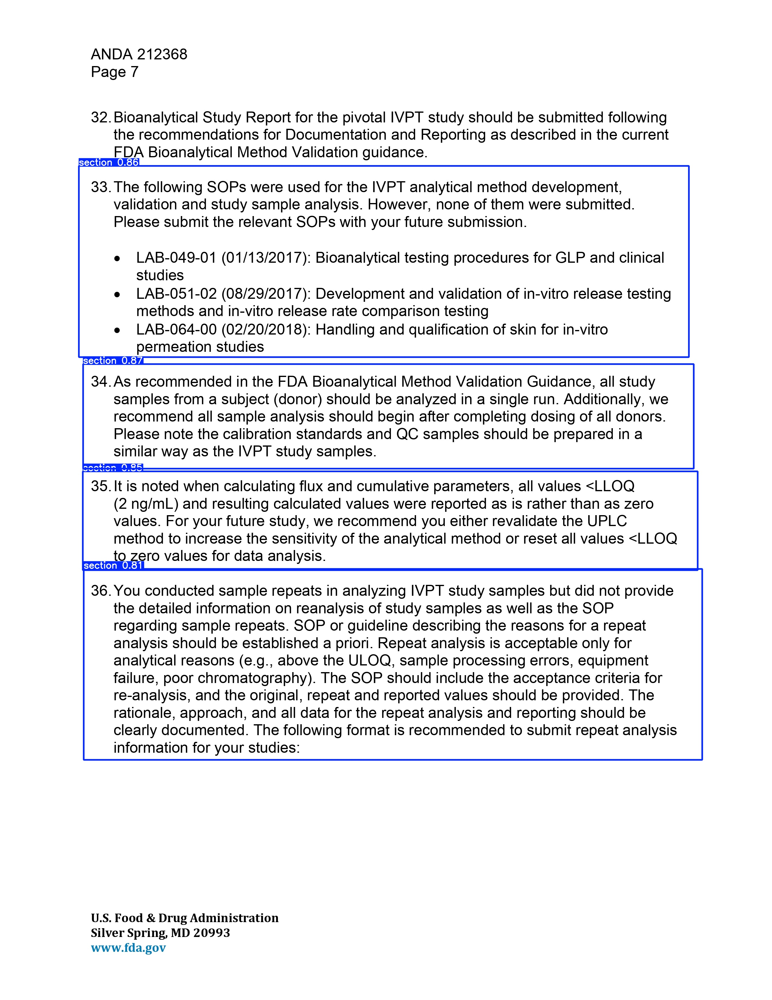

In [43]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp10/*.jpg'): #assuming JPG
    display(Image(filename=imageName))

    print("\n")

In [4]:
!pip install pytesseract

Get:1 http://security.ubuntu.com/ubuntu jammy-security InRelease [129 kB]
Hit:2 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:3 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [128 kB]
Hit:4 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Hit:5 http://archive.ubuntu.com/ubuntu jammy-backports InRelease
Hit:6 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease
Hit:7 https://ppa.launchpadcontent.net/c2d4u.team/c2d4u4.0+/ubuntu jammy InRelease
Hit:8 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Hit:9 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Hit:10 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Fetched 257 kB in 1s (201 kB/s)
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
45 packages can be upgraded. Run 'apt list --upgradable' to see them.
Reading package lists... Done
Building dependenc

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following NEW packages will be installed:
  poppler-utils
0 upgraded, 1 newly installed, 0 to remove and 45 not upgraded.
Need to get 186 kB of archives.
After this operation, 696 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy-updates/main amd64 poppler-utils amd64 22.02.0-2ubuntu0.4 [186 kB]
Fetched 186 kB in 0s (957 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debconf/FrontEnd/Dialog.pm line 78, <> line 1.)
debconf: falling back to frontend: Readline
debconf: unable to initialize frontend: Readline
debconf: (This frontend requires a controlling tty.)
debconf: falling back to frontend: Teletype
dpkg-preconfigure: unable to re-open stdin: 
Selecting previously unselected package poppler-utils.
(Reading database ... 121972 

# To convert images from PDF

In [29]:
!pip install pymupdf

import fitz  # PyMuPDF

def convert_pdf_to_images(pdf_path, output_folder):
    """Converts a PDF file to a sequence of images using PyMuPDF.

    Args:
        pdf_path (str): The path to the PDF file.
        output_folder (str): The folder where images will be saved.
    """

    import os
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    doc = fitz.open(pdf_path)
    for page_num in range(len(doc)):
        page = doc.load_page(page_num)
        pix = page.get_pixmap()
        output_path = os.path.join(output_folder, f'page_{page_num + 1}.png')
        pix.save(output_path)
    print(f"PDF converted to images and saved in: {output_folder}")

# Example usage:
pdf_path = '/content/2020 04 16 CRL.pdf'  # Replace with your PDF path
output_folder = '/content/pdf_images'    # Choose an output folder
if not os.path.exists(output_folder):
    os.makedirs(output_folder)
convert_pdf_to_images(pdf_path, output_folder)

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.5/3.5 MB 8.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.7/15.7 MB 14.0 MB/s eta 0:00:00
PDF converted to images and saved in: /content/pdf_images
